<a href="https://colab.research.google.com/github/Ankita6332/2248436_Assessment/blob/main/2248436_FlowerImageClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q efficientnet

**IMPORTING NECESSARY LIBRARIES**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import random
import math
from matplotlib import pyplot as plt
import cv2
from tqdm.notebook import tqdm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

import tensorflow as tf
import tensorflow.keras.backend as K
#import efficientnet.tfkeras as efn
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2L
import efficientnet.tfkeras as efn
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential
import tensorflow.keras.layers as L
from tensorflow.keras import layers
import tensorflow.keras as keras
from tensorflow.keras.layers import Input, Conv2D
from tensorflow.keras.layers import MaxPool2D, Flatten, Dense
from tensorflow.keras import Model
from tensorflow.keras.utils import to_categorical

In [ ]:
# Set Random Seed
def set_seed(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.experimental.numpy.random.seed(seed)

    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")
set_seed()

Random seed set as 42


In [ ]:
# Configuration
IMAGE_SIZE = 224
BATCH_SIZE = 16

In [ ]:
gpus = tf.config.experimental.list_logical_devices('GPU')
strategy = tf.distribute.MirroredStrategy(gpus)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Define image directory path and collect file paths and labels.
# Create a DataFrame to store image data and display the first few rows.

raw_dir = '/content/drive/MyDrive/flowers'
paths = []
labels = []
for i in os.listdir(raw_dir):
    paths.append(os.path.join(raw_dir,i))
    labels.append(i.split('_')[0])

raw_input = pd.DataFrame({'path':paths,
                          'label':labels})
raw_input.head()

,path,label
0,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea
1,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea
2,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea
3,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea
4,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea


**DATA CLEANING & PREPROCESSING**

In [ ]:
# Check the number of images from each category
df_count = raw_input['label'].value_counts().rename_axis('label').reset_index(name='counts')
df_count

,label,counts
0,daisies,83
1,lilies,81
2,gardenias,77
3,peonies,75
4,bougainvillea,74
5,garden,74
6,hibiscus,74
7,tulip,71
8,orchids,64
9,hydrangeas,60


In [ ]:
# Convert label to Int category
LE = LabelEncoder()
raw_input['category'] = LE.fit_transform(raw_input['label'])

In [ ]:
# Check Encoding
raw_input[['label','category']].drop_duplicates()

,label,category
0,bougainvillea,0
53,daisies,1
133,garden,2
204,gardenias,3
290,hibiscus,4
364,hydrangeas,5
427,lilies,6
501,orchids,7
568,peonies,8
638,tulip,9


In [ ]:
raw_input.head()

,path,label,category
0,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea,0
1,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea,0
2,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea,0
3,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea,0
4,/content/drive/MyDrive/flowers/bougainvillea_0...,bougainvillea,0


In [ ]:
# Prepare images
all_images = []
for i in tqdm(paths):
    image = cv2.imread(i)
    image = cv2.resize(image,(IMAGE_SIZE,IMAGE_SIZE),interpolation=cv2.INTER_AREA)
    all_images.append(image)


  0%|          | 0/733 [00:00<?, ?it/s]

Start Plotting Random Images for daisies Flowers


<ipython-input-48-eaf745e2f8a7>:4: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  image_index = sorted(random.sample(set(raw_input[raw_input['label']==label].index), 9))


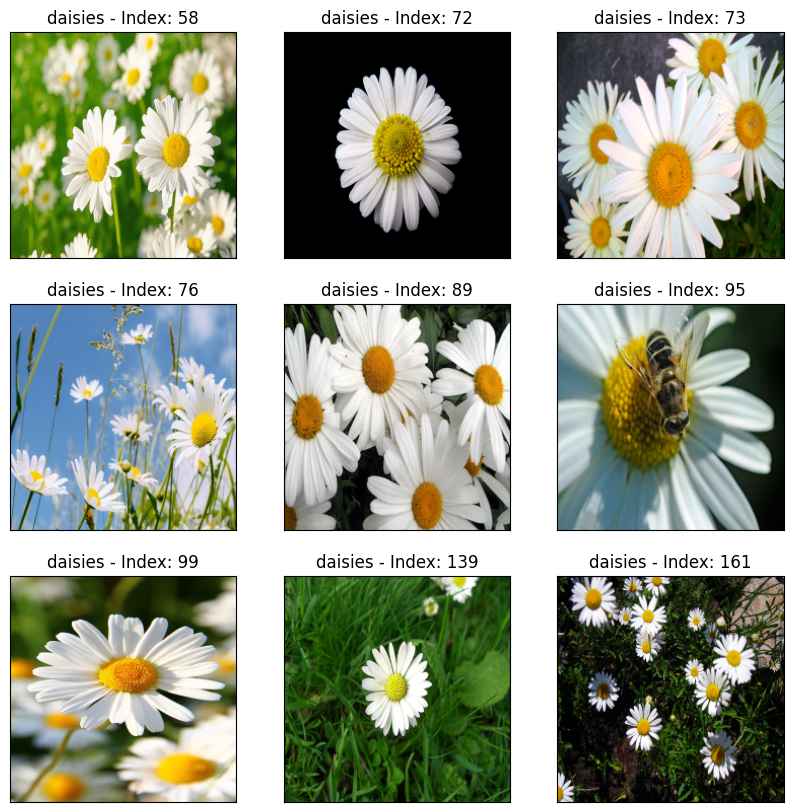

 
Start Plotting Random Images for lilies Flowers


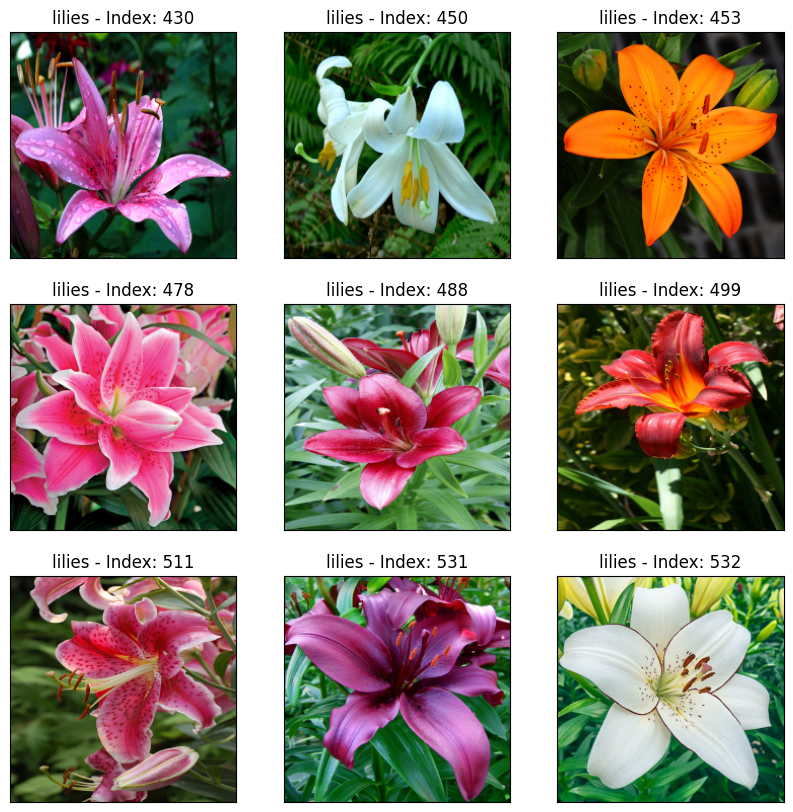

 
Start Plotting Random Images for gardenias Flowers


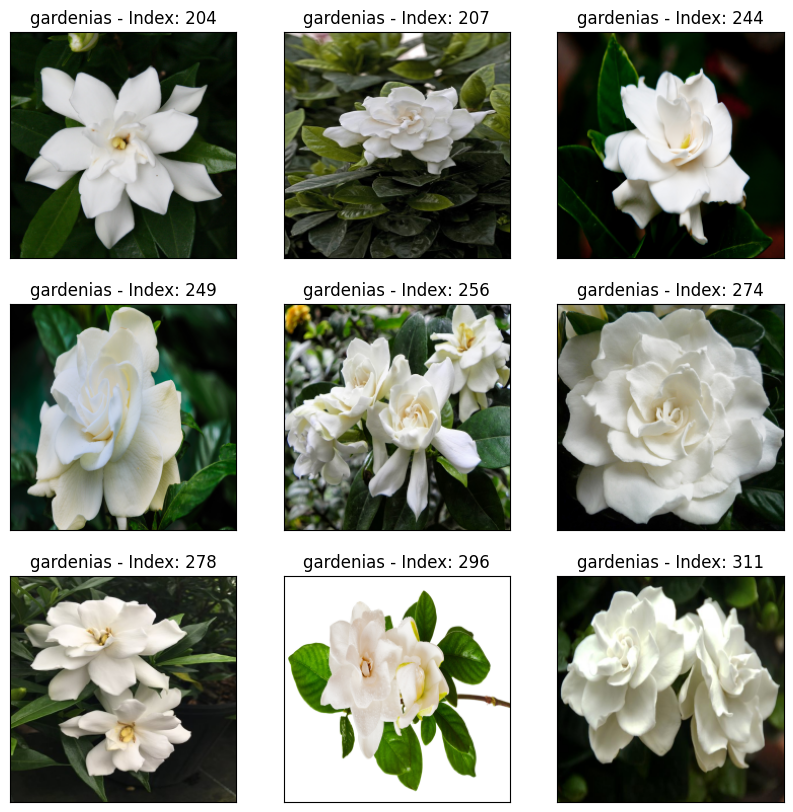

 
Start Plotting Random Images for peonies Flowers


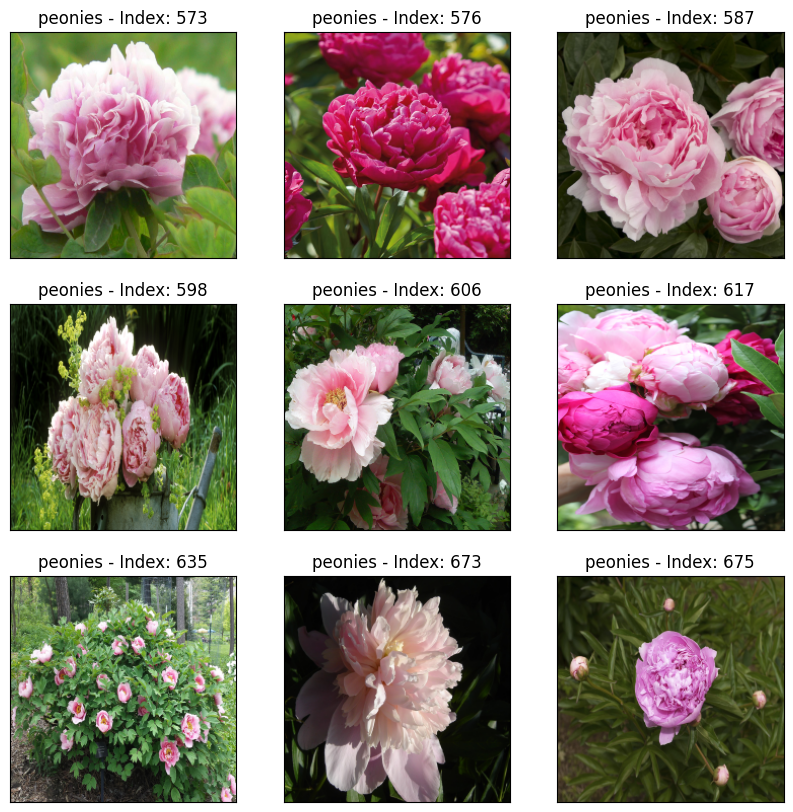

 
Start Plotting Random Images for bougainvillea Flowers


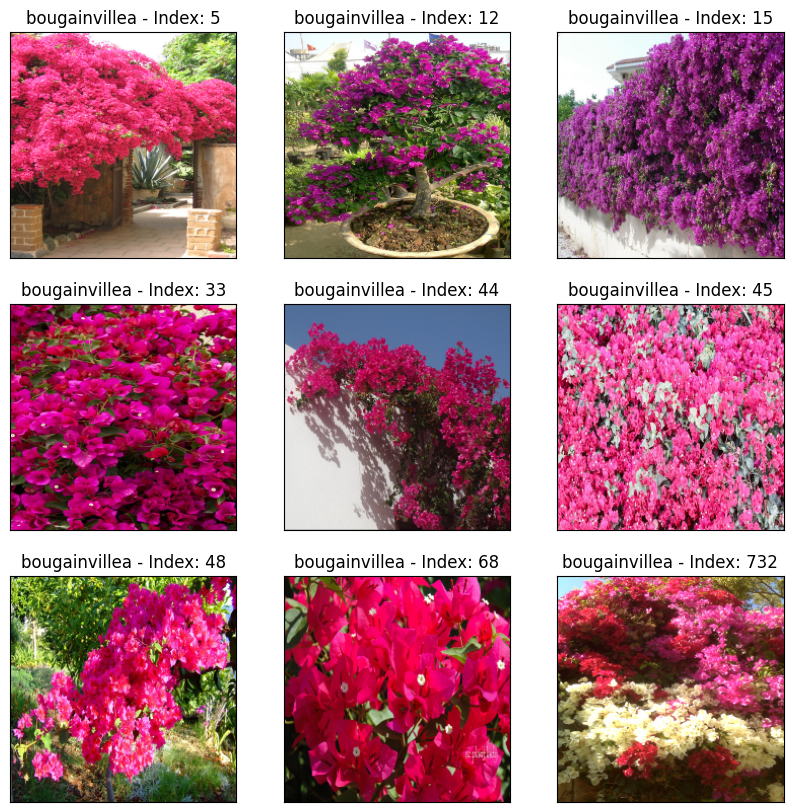

 
Start Plotting Random Images for garden Flowers


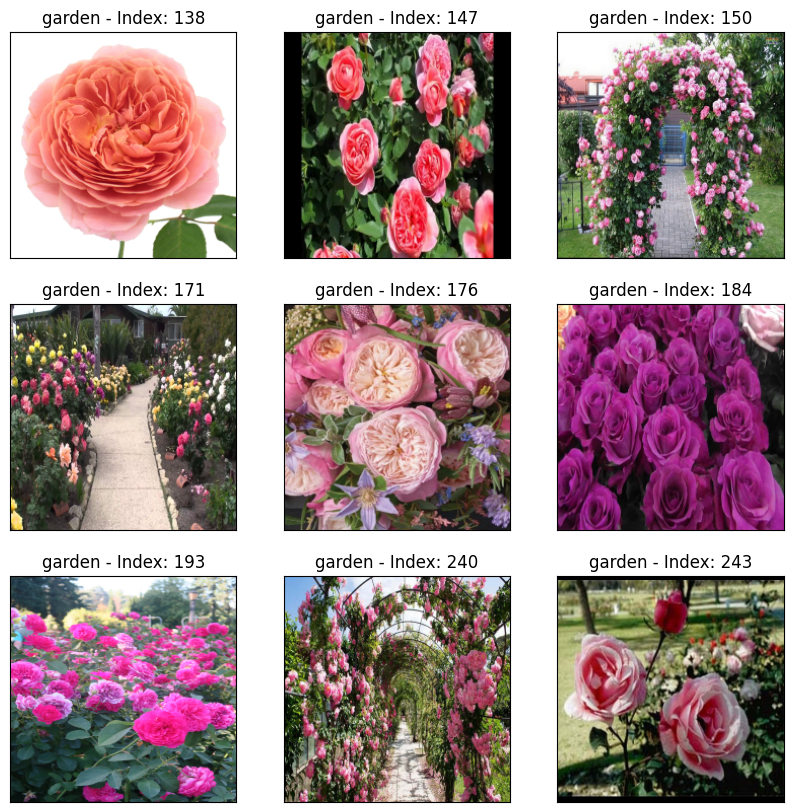

 
Start Plotting Random Images for hibiscus Flowers


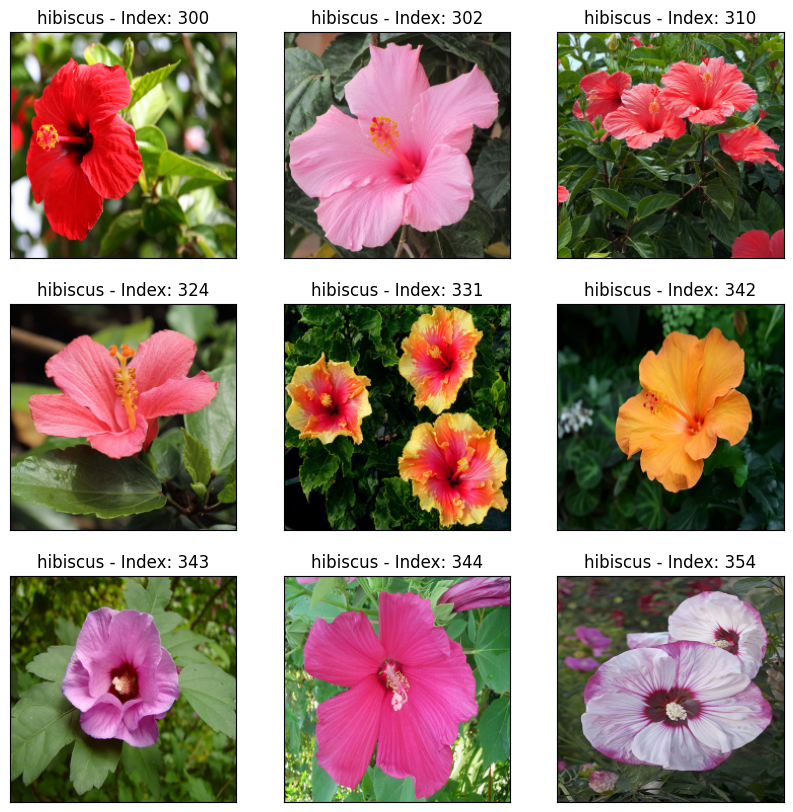

 
Start Plotting Random Images for tulip Flowers


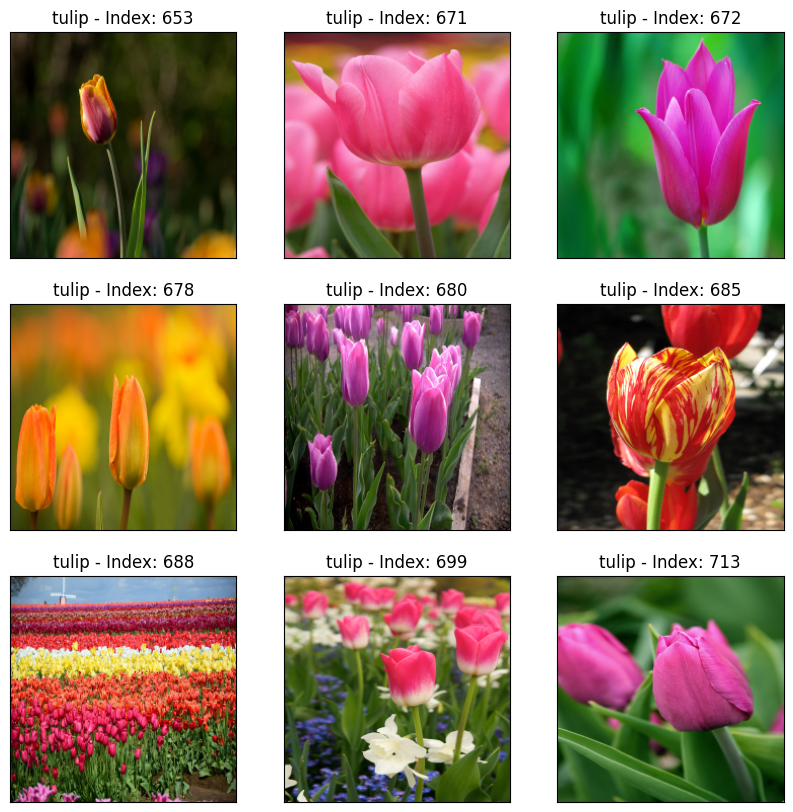

 
Start Plotting Random Images for orchids Flowers


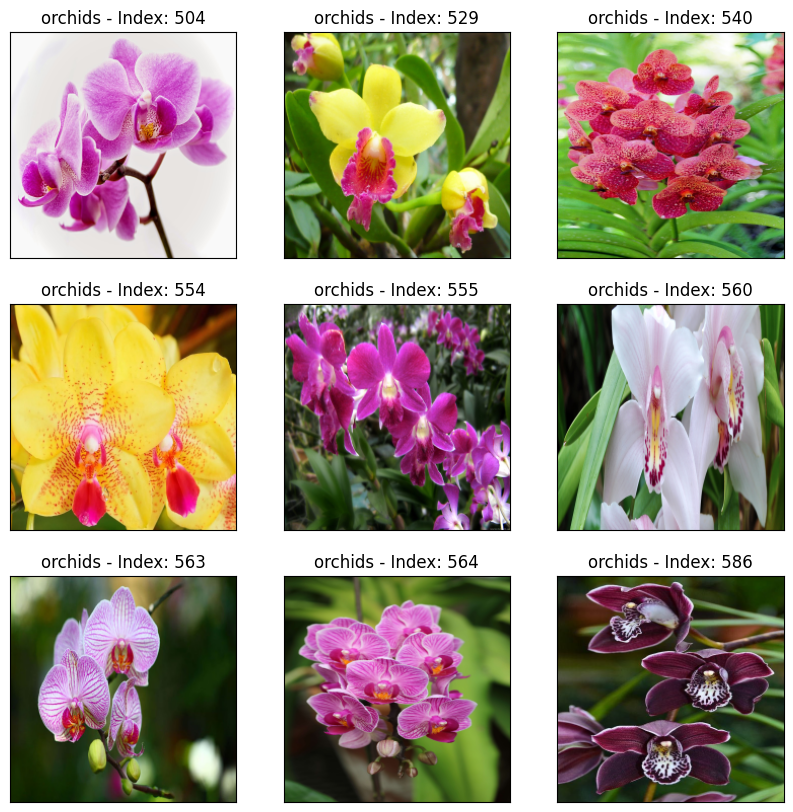

 
Start Plotting Random Images for hydrangeas Flowers


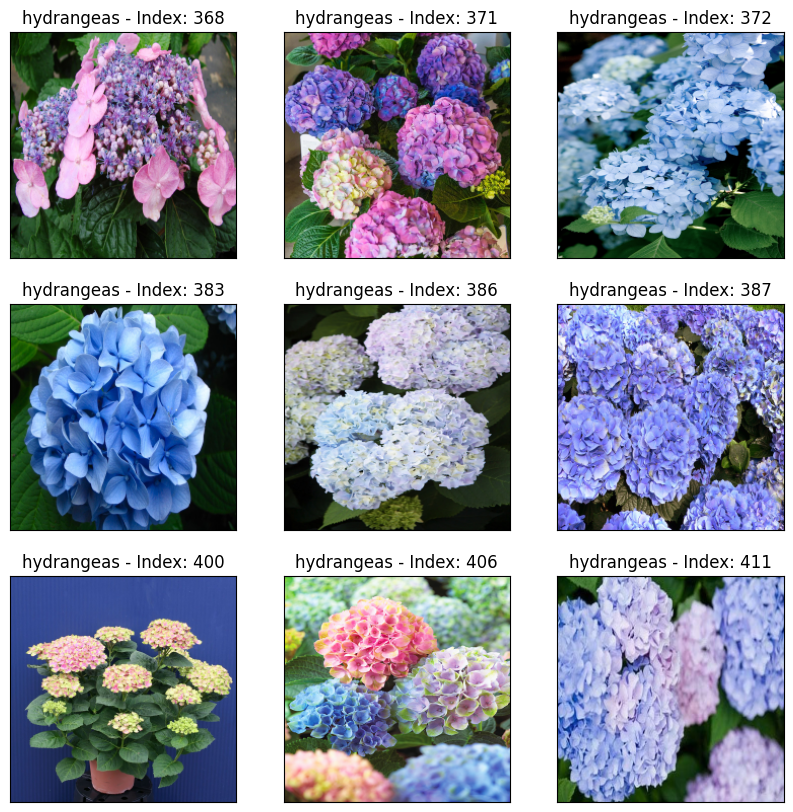

**SAMPLE FROM DATASET**

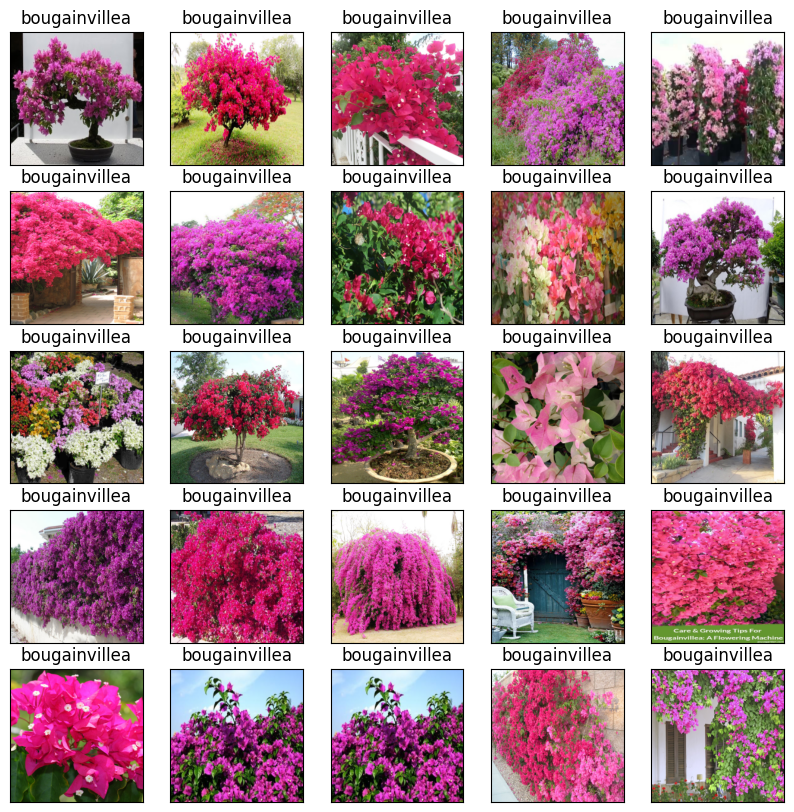

In [ ]:
# Plot first 25 images with label
plt.figure(figsize=(10,10))
for i in range(25) :
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(labels[i])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(all_images[i], cv2.COLOR_BGR2RGB))


*TRAIN - TEST - SPLIT *

In [ ]:
# Train test split
X = raw_input['path'].values
y = to_categorical(raw_input['category'], num_classes = 10)
X_2, X_test, y_2, y_test = train_test_split(X, y, test_size=0.095, random_state=42,shuffle = True, stratify = y)
X_train, X_val, y_train, y_val = train_test_split(X_2, y_2, test_size=0.2, random_state=42,shuffle = True, stratify = y_2)

In [ ]:
print(f'X_train has {len(X_train)} images; X_val has {len(X_val)} images; X_test has {len(X_test)} images')

X_train has 530 images; X_val has 133 images; X_test has 70 images


**PREPARE DATA**

In [ ]:
# Prepare Data

def load_dataset(filepath,label):
    dataset = tf.data.Dataset.from_tensor_slices((filepath, label))
    return dataset


def decode_image(filepath, label=None):
    image = tf.io.read_file(filepath)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

    if label is None:
        return image
    else:
        return image, label

def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)

    if label is None:
        return image
    else:
        return image, label

In [ ]:
def get_mat(rotation, shear, height_zoom, width_zoom, height_shift, width_shift):
    # returns 3x3 transformmatrix which transforms indicies

    # CONVERT DEGREES TO RADIANS
    rotation = math.pi * rotation / 180.
    shear = math.pi * shear / 180.

    # ROTATION MATRIX
    c1 = tf.math.cos(rotation)
    s1 = tf.math.sin(rotation)
    one = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')
    rotation_matrix = tf.reshape( tf.concat([c1,s1,zero, -s1,c1,zero, zero,zero,one],axis=0),[3,3] )

    # SHEAR MATRIX
    c2 = tf.math.cos(shear)
    s2 = tf.math.sin(shear)
    shear_matrix = tf.reshape( tf.concat([one,s2,zero, zero,c2,zero, zero,zero,one],axis=0),[3,3] )

    # ZOOM MATRIX
    zoom_matrix = tf.reshape( tf.concat([one/height_zoom,zero,zero, zero,one/width_zoom,zero, zero,zero,one],axis=0),[3,3] )

    # SHIFT MATRIX
    shift_matrix = tf.reshape( tf.concat([one,zero,height_shift, zero,one,width_shift, zero,zero,one],axis=0),[3,3] )

    return K.dot(K.dot(rotation_matrix, shear_matrix), K.dot(zoom_matrix, shift_matrix))

**TRANSFORM DATA**

In [ ]:
def transform(image,label):
    # input image - is one image of size [dim,dim,3] not a batch of [b,dim,dim,3]
    # output - image randomly rotated, sheared, zoomed, and shifted
    DIM = IMAGE_SIZE
    XDIM = DIM%2 #fix for size 331

    rot = 15. * tf.random.normal([1],dtype='float32')
    shr = 5. * tf.random.normal([1],dtype='float32')
    h_zoom = 1.0 + tf.random.normal([1],dtype='float32')/10.
    w_zoom = 1.0 + tf.random.normal([1],dtype='float32')/10.
    h_shift = 16. * tf.random.normal([1],dtype='float32')
    w_shift = 16. * tf.random.normal([1],dtype='float32')

    # GET TRANSFORMATION MATRIX
    m = get_mat(rot,shr,h_zoom,w_zoom,h_shift,w_shift)

    # LIST DESTINATION PIXEL INDICES
    x = tf.repeat( tf.range(DIM//2,-DIM//2,-1), DIM )
    y = tf.tile( tf.range(-DIM//2,DIM//2),[DIM] )
    z = tf.ones([DIM*DIM],dtype='int32')
    idx = tf.stack( [x,y,z] )

    # ROTATE DESTINATION PIXELS ONTO ORIGIN PIXELS
    idx2 = K.dot(m,tf.cast(idx,dtype='float32'))
    idx2 = K.cast(idx2,dtype='int32')
    idx2 = K.clip(idx2,-DIM//2+XDIM+1,DIM//2)

    # FIND ORIGIN PIXEL VALUES
    idx3 = tf.stack( [DIM//2-idx2[0,], DIM//2-1+idx2[1,]] )
    d = tf.gather_nd(image,tf.transpose(idx3))

    return tf.reshape(d,[DIM,DIM,3]),label

In [ ]:
# Functions for creating training, validation, and test datasets with preprocessing steps.
# Decode images, cache them, and batch them according to the specified configurations.

def get_training_dataset(dataset,do_aug=True):
    dataset = dataset.map(decode_image)
    dataset = dataset.cache()
    dataset = dataset.map(data_augment)
    if do_aug:
        dataset = dataset.map(transform)
    dataset = dataset.batch(BATCH_SIZE,drop_remainder=True)
    return dataset

def get_validation_dataset(dataset):
    dataset = dataset.map(decode_image)
    dataset = dataset.cache()
    dataset = dataset.batch(BATCH_SIZE)
    return dataset

def get_test_dataset(dataset):
    dataset = dataset.map(decode_image)
    dataset = dataset.cache()
    dataset = dataset.batch(BATCH_SIZE)
    return dataset

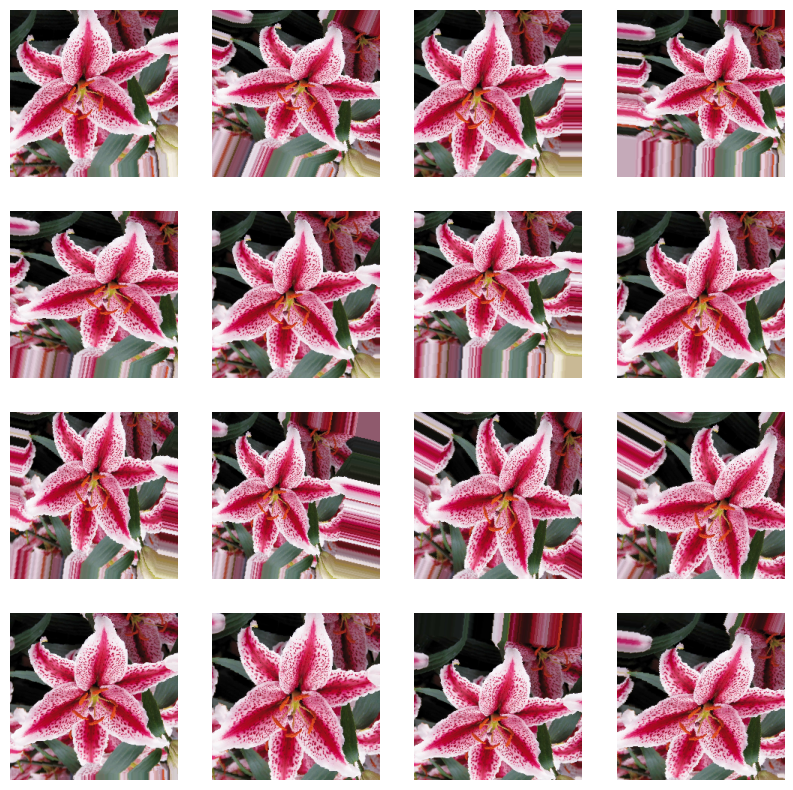

In [ ]:
# Display Augmentation Example

row = 4; col = 4;
all_elements = get_training_dataset(load_dataset(X_train, y_train),do_aug=False).unbatch()
one_element = tf.data.Dataset.from_tensors( next(iter(all_elements)) )
augmented_element = one_element.repeat().map(transform).batch(row*col)

for (img,label) in augmented_element:
    plt.figure(figsize=(10,int(10*row/col)))
    for j in range(row*col):
        plt.subplot(row,col,j+1)
        plt.axis('off')
        plt.imshow(img[j,])
    plt.show()
    break

In [ ]:
train_dataset = get_training_dataset(load_dataset(X_train, y_train),do_aug=True)

valid_dataset = get_validation_dataset(load_dataset(X_val, y_val))

test_dataset =  get_test_dataset(load_dataset(X_test, y_test))


In [ ]:
# input
input = Input(shape =(IMAGE_SIZE,IMAGE_SIZE,3))
# 1st Conv Block

x = Conv2D (filters =64, kernel_size =3, padding ='same', activation='relu')(input)
x = Conv2D (filters =64, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)
# 2nd Conv Block

x = Conv2D (filters =128, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =128, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)
# 3rd Conv block

x = Conv2D (filters =256, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =256, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =256, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)
# 4th Conv block

x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)

# 5th Conv block

x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = Conv2D (filters =512, kernel_size =3, padding ='same', activation='relu')(x)
x = MaxPool2D(pool_size =2, strides =2, padding ='same')(x)
# Fully connected layers

x = Flatten()(x)
x = Dense(units = 4096, activation ='relu')(x)
x = Dense(units = 4096, activation ='relu')(x)
output = Dense(units = 10, activation ='softmax')(x)
# creating the model

model = Model (inputs=input, outputs =output)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                             

In [ ]:
# Compile the model with the Adam optimizer, categorical cross-entropy loss, and accuracy metric.

model.compile(
                optimizer = 'Adam',
                loss = 'categorical_crossentropy',
                metrics=['categorical_accuracy']
              )

**VGG - 16 MODEL **

In [ ]:
base_model = tf.keras.applications.VGG16(weights = 'imagenet', include_top = False, input_shape = (IMAGE_SIZE,IMAGE_SIZE,3))
for layer in base_model.layers:
    layer.trainable = False
base_model.summary()

58889256/58889256 [==============================] - 1s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
model = tf.keras.Sequential([
            base_model,
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(4096, activation='relu'),
            tf.keras.layers.Dense(4096, activation='relu'),
            tf.keras.layers.Dense(10, activation='softmax')
                            ])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_3 (Dense)             (None, 4096)              102764544 
                                                                 
 dense_4 (Dense)             (None, 4096)              16781312  
                                                                 
 dense_5 (Dense)             (None, 10)                40970     
                                                                 
Total params: 134301514 (512.32 MB)
Trainable params: 119586826 (456.19 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [ ]:
model.compile(
                optimizer = 'Adam',
                loss = 'categorical_crossentropy',
                metrics=['categorical_accuracy']
              )

In [66]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5)
history = model.fit(train_dataset,validation_data=valid_dataset,epochs=30, callbacks = [early_stopping])

Epoch 1/30
33/33 [==============================] - 443s 13s/step - loss: 6.6872 - categorical_accuracy: 0.2538 - val_loss: 1.4923 - val_categorical_accuracy: 0.4286
Epoch 2/30
33/33 [==============================] - 437s 13s/step - loss: 0.9520 - categorical_accuracy: 0.6723 - val_loss: 0.8167 - val_categorical_accuracy: 0.7218
Epoch 3/30
33/33 [==============================] - 433s 13s/step - loss: 0.3017 - categorical_accuracy: 0.8977 - val_loss: 1.5983 - val_categorical_accuracy: 0.6165
Epoch 4/30
33/33 [==============================] - 438s 13s/step - loss: 0.1992 - categorical_accuracy: 0.9470 - val_loss: 1.4897 - val_categorical_accuracy: 0.6541
Epoch 5/30
33/33 [==============================] - 434s 13s/step - loss: 0.1488 - categorical_accuracy: 0.9508 - val_loss: 1.1088 - val_categorical_accuracy: 0.7068
Epoch 6/30
33/33 [==============================] - 418s 13s/step - loss: 0.0844 - categorical_accuracy: 0.9697 - val_loss: 1.2291 - val_categorical_accuracy: 0.7368
Epoc

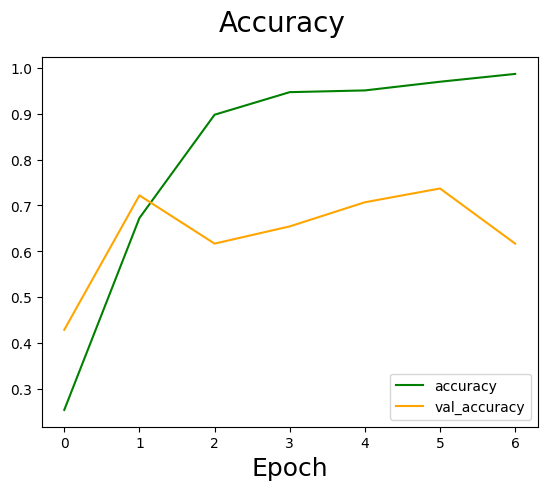

In [67]:
# Plotting Model Accuracy Performance
fig = plt.figure()
plt.plot(history.history['categorical_accuracy'], color='green', label='accuracy')
plt.plot(history.history['val_categorical_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='lower right')
plt.xlabel('Epoch', fontsize=18)
plt.show()

In [68]:
test_acc = model.evaluate(test_dataset)[1]
print(f'Accuracy on Test(Unseen) Dataset is \033[1m{test_acc:.2%}\033[0m')

5/5 [==============================] - 67s 12s/step - loss: 2.2214 - categorical_accuracy: 0.6857
Accuracy on Test(Unseen) Dataset is 68.57%


**EFFICIENTNET B7 MODEL**

In [69]:
efnet = efn.EfficientNetB7(
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
    weights='noisy-student',
    include_top=False,
    pooling='avg')
efnet.trainable = False

258068648/258068648 [==============================] - 1s 0us/step


In [71]:
model = tf.keras.Sequential([
    efnet,
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(10, activation='softmax')
])

In [72]:
model.compile(
                optimizer = 'Adam',
                loss = 'categorical_crossentropy',
                metrics=['categorical_accuracy']
              )
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b7 (Functiona  (None, 2560)              64097680  
 l)                                                              
                                                                 
 dense_6 (Dense)             (None, 128)               327808    
                                                                 
 dense_7 (Dense)             (None, 10)                1290      
                                                                 
Total params: 64426778 (245.77 MB)
Trainable params: 329098 (1.26 MB)
Non-trainable params: 64097680 (244.51 MB)
_________________________________________________________________


In [73]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 5)
history = model.fit(train_dataset,validation_data=valid_dataset,epochs=5, callbacks = [early_stopping])

Epoch 1/5
33/33 [==============================] - 336s 10s/step - loss: 2.2394 - categorical_accuracy: 0.2652 - val_loss: 1.7514 - val_categorical_accuracy: 0.4586
Epoch 2/5
33/33 [==============================] - 301s 9s/step - loss: 1.6213 - categorical_accuracy: 0.4811 - val_loss: 1.2640 - val_categorical_accuracy: 0.6090
Epoch 3/5
33/33 [==============================] - 312s 10s/step - loss: 1.3883 - categorical_accuracy: 0.5341 - val_loss: 1.0712 - val_categorical_accuracy: 0.6541
Epoch 4/5
33/33 [==============================] - 303s 9s/step - loss: 1.2595 - categorical_accuracy: 0.5777 - val_loss: 0.9505 - val_categorical_accuracy: 0.6767
Epoch 5/5
33/33 [==============================] - 328s 10s/step - loss: 1.0472 - categorical_accuracy: 0.6420 - val_loss: 0.8837 - val_categorical_accuracy: 0.6767


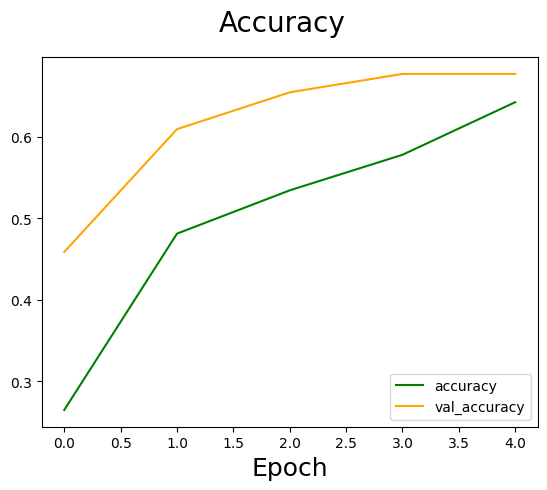

In [75]:
# Plotting Model Accuracy Performance
fig = plt.figure()
plt.plot(history.history['categorical_accuracy'], color='green', label='accuracy')
plt.plot(history.history['val_categorical_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc='lower right')
plt.xlabel('Epoch', fontsize=18)
plt.show()

In [76]:
# Get new dataset
IMAGE_SIZE = 800

train_dataset = get_training_dataset(load_dataset(X_train, y_train),do_aug=True)

valid_dataset = get_validation_dataset(load_dataset(X_val, y_val))

test_dataset =  get_test_dataset(load_dataset(X_test, y_test))

In [77]:
efnet = efn.EfficientNetB7(
    input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3),
    weights='noisy-student',
    include_top=False,
    pooling='avg')
efnet.trainable = False

In [78]:
 model = tf.keras.Sequential([
            efnet,
            tf.keras.layers.Dense(128, activation='relu'),
            tf.keras.layers.Dense(10, activation='softmax')
                            ])

In [79]:
model.compile(
                optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
                loss = 'categorical_crossentropy',
                metrics=['categorical_accuracy']
              )
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b7 (Functiona  (None, 2560)              64097680  
 l)                                                              
                                                                 
 dense_8 (Dense)             (None, 128)               327808    
                                                                 
 dense_9 (Dense)             (None, 10)                1290      
                                                                 
Total params: 64426778 (245.77 MB)
Trainable params: 329098 (1.26 MB)
Non-trainable params: 64097680 (244.51 MB)
_________________________________________________________________
